This notebook aims at storing a RGB image in a SIREN network, instead of a black and white one.

In [ ]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize, Grayscale
import numpy as np
import skimage
import matplotlib.pyplot as plt
import random

import time

def get_mgrid(sidelen, dim=2, depth=1):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])+(torch.linspace(-1, 1, steps=depth),)
    #print(tensors)
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    #print(mgrid)
    mgrid = mgrid.reshape(depth, sidelen**2, dim+1)
    return mgrid

In [ ]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [ ]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [ ]:
def get_astronaut_tensor(sidelength):
    img = Image.fromarray(skimage.data.astronaut())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [ ]:
class ImageFitting(Dataset):
    def __init__(self, sidelength, nb_images=2):
        super().__init__()

        img2 = get_astronaut_tensor(sidelength)
        print(img2.size())
        img2.permute(1, 2, 0).view(sidelength**2, 3)
        print("Sizes image:")
        print(img2.size())
        #imgf=torch.cat((img, img2), dim=0).view(nb_images, -1)
        #print(imgf.size())
        self.pixels = img2
        self.coords = get_mgrid(sidelength, 2, depth=nb_images)
        print(self.coords.size())

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > len(self.pixels): raise IndexError
            
        return self.coords, self.pixels

In [ ]:
size_img=128
nb_images=1
cameraman = ImageFitting(size_img, nb_images=1)
dataloader1 = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=3, out_features=3, hidden_features=512, 
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

torch.Size([3, 128, 128])
Sizes image:
torch.Size([3, 128, 128])
torch.Size([1, 16384, 3])


Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=3, out_features=512, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=512, out_features=512, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=512, out_features=512, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=512, out_features=512, bias=True)
    )
    (4): Linear(in_features=512, out_features=3, bias=True)
  )
)

Input, output sizes;  torch.Size([1, 1, 16384, 3]) torch.Size([1, 1, 16384, 3])
Model_input:  tensor([[[-1.0000, -1.0000, -1.0000],
         [-1.0000, -0.9843, -1.0000],
         [-1.0000, -0.9685, -1.0000]]], device='cuda:0')
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Step 0, Total loss 0.384910


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Size image:  torch.Size([1, 1, 16384, 3])


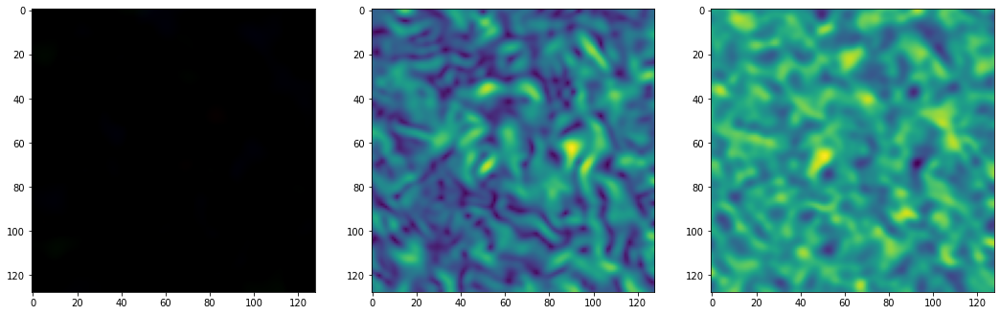

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 10, Total loss 0.083368
Size image:  torch.Size([1, 1, 16384, 3])


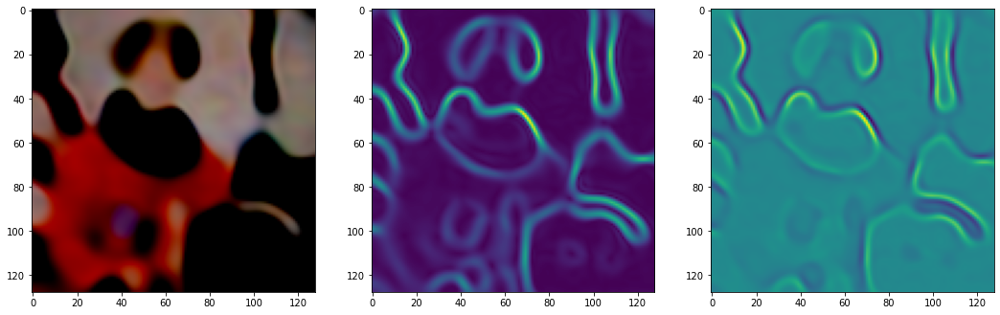

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 20, Total loss 0.029566
Size image:  torch.Size([1, 1, 16384, 3])


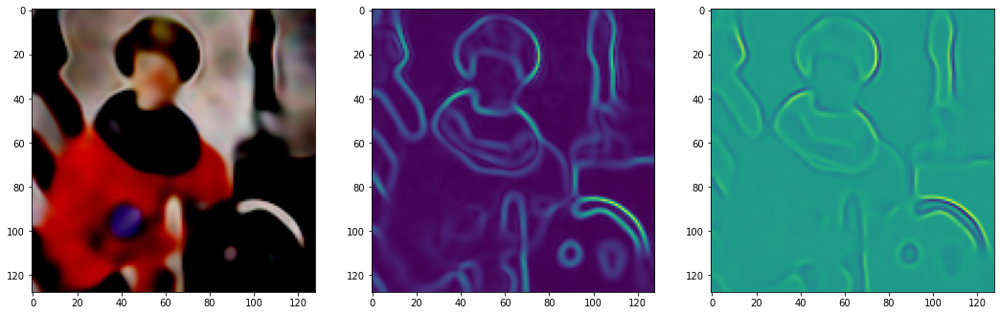

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 30, Total loss 0.017255
Size image:  torch.Size([1, 1, 16384, 3])


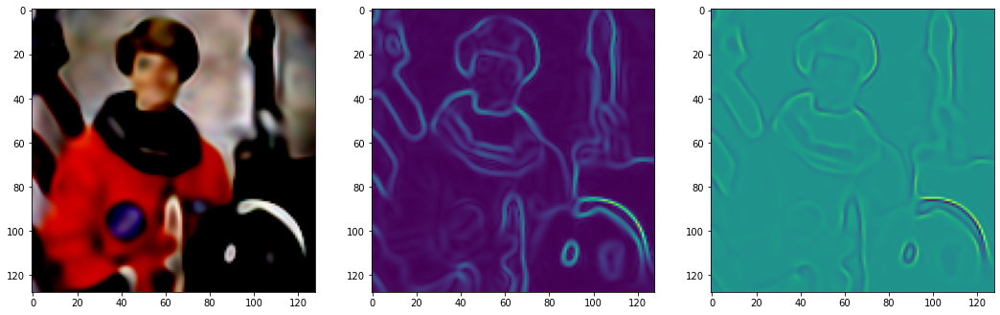

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 40, Total loss 0.012199
Size image:  torch.Size([1, 1, 16384, 3])


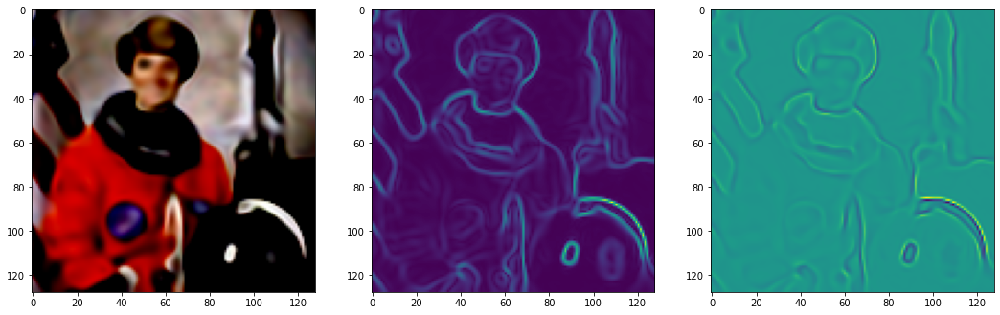

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 50, Total loss 0.009166
Size image:  torch.Size([1, 1, 16384, 3])


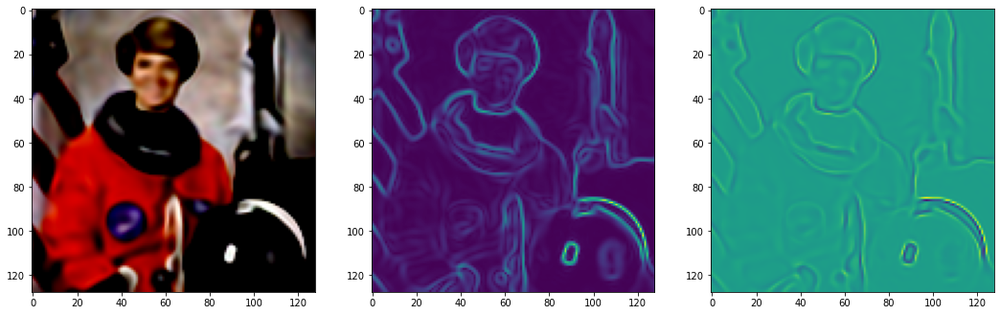

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 60, Total loss 0.007132
Size image:  torch.Size([1, 1, 16384, 3])


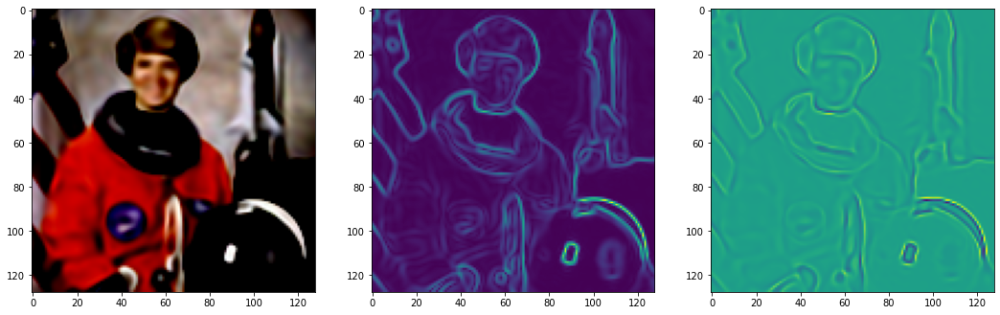

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 70, Total loss 0.005681
Size image:  torch.Size([1, 1, 16384, 3])


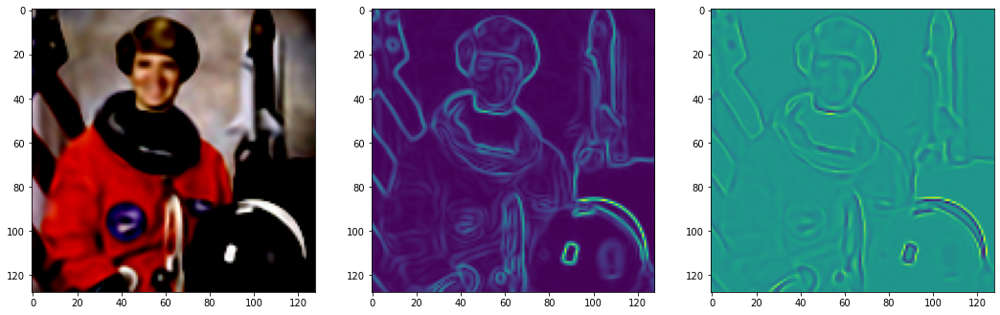

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 80, Total loss 0.005137
Size image:  torch.Size([1, 1, 16384, 3])


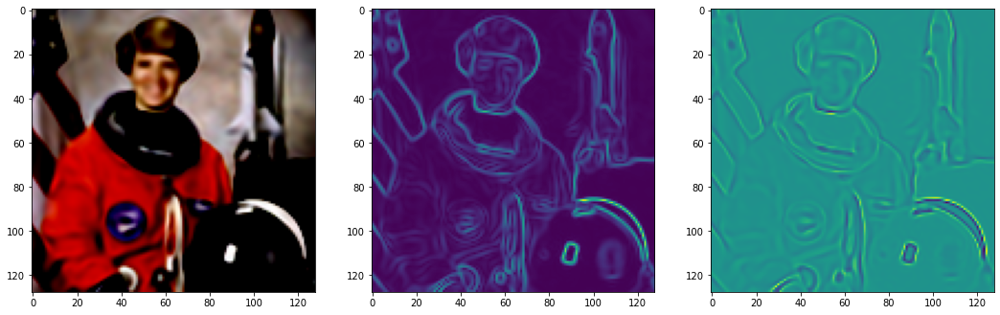

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 90, Total loss 0.004091
Size image:  torch.Size([1, 1, 16384, 3])


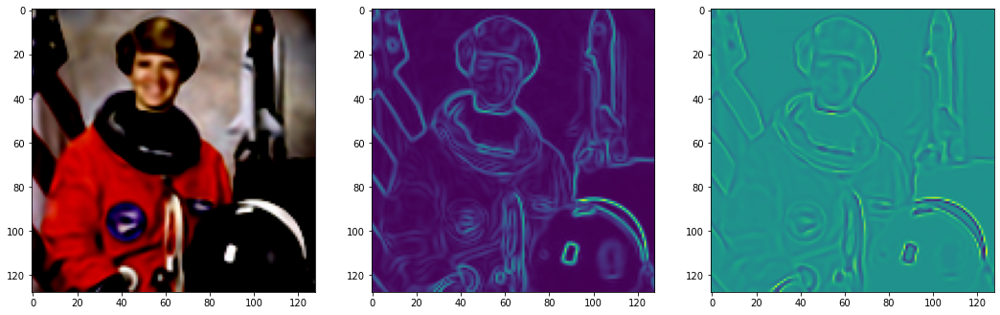

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 100, Total loss 0.003452
Size image:  torch.Size([1, 1, 16384, 3])


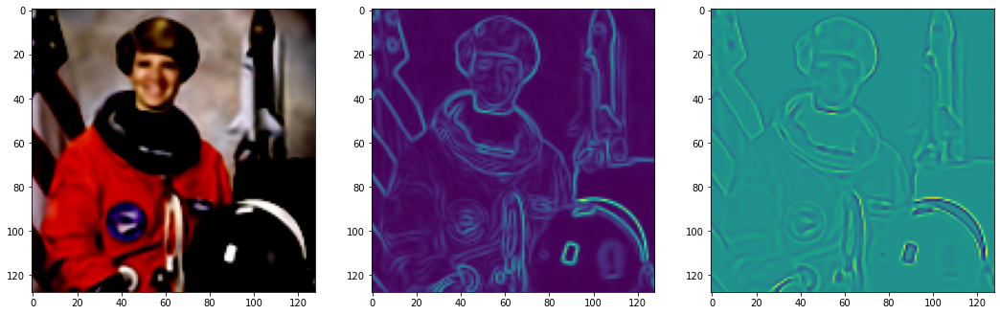

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 110, Total loss 0.002963
Size image:  torch.Size([1, 1, 16384, 3])


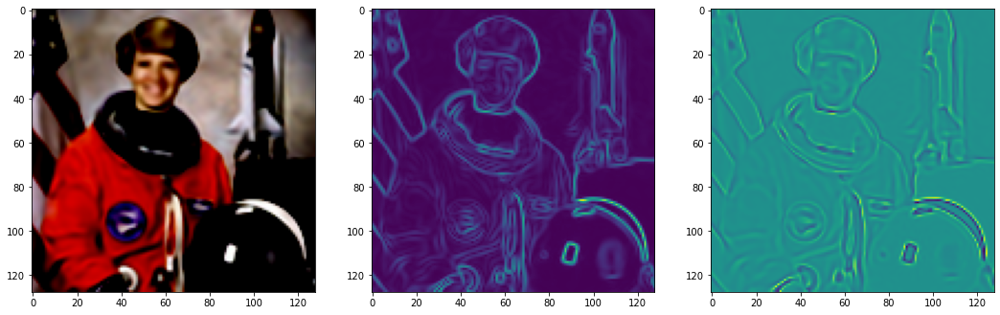

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 120, Total loss 0.002582
Size image:  torch.Size([1, 1, 16384, 3])


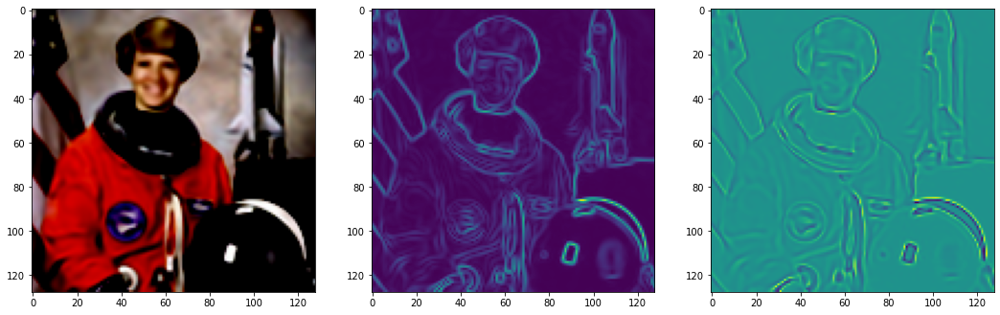

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 130, Total loss 0.002275
Size image:  torch.Size([1, 1, 16384, 3])


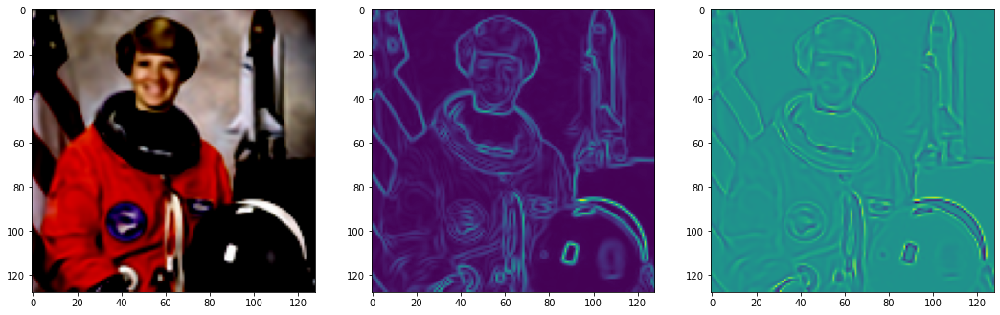

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 140, Total loss 0.002021
Size image:  torch.Size([1, 1, 16384, 3])


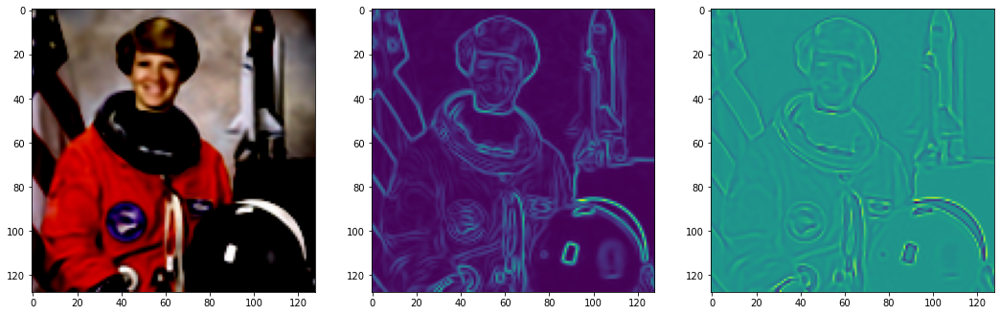

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 150, Total loss 0.001938
Size image:  torch.Size([1, 1, 16384, 3])


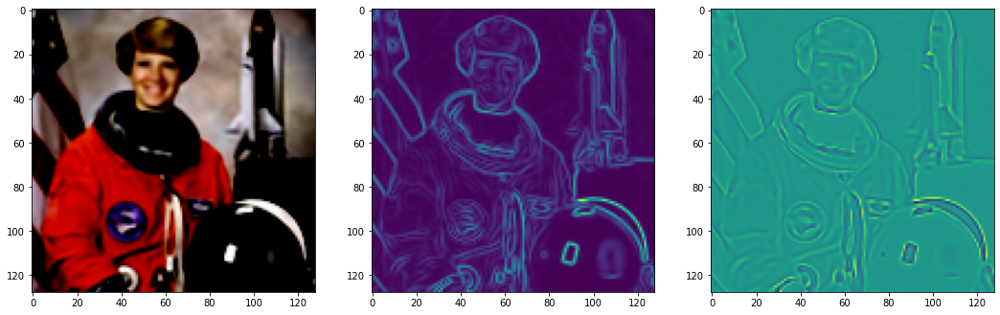

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 160, Total loss 0.001663
Size image:  torch.Size([1, 1, 16384, 3])


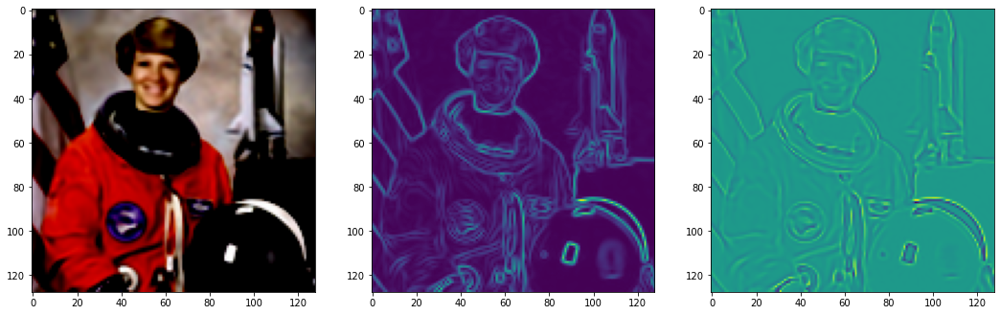

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 170, Total loss 0.001477
Size image:  torch.Size([1, 1, 16384, 3])


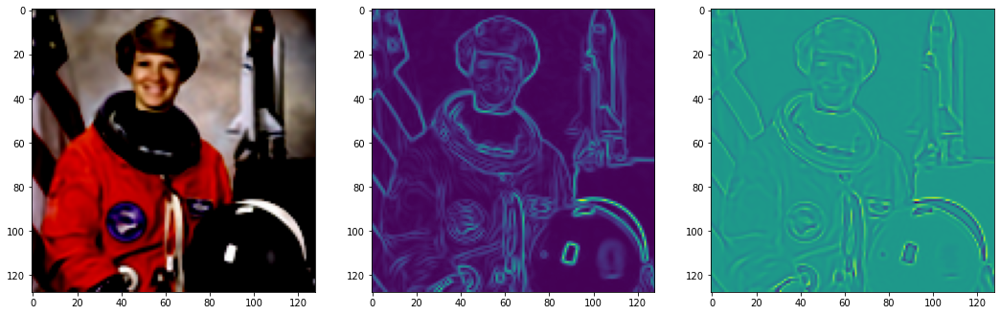

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 180, Total loss 0.001333
Size image:  torch.Size([1, 1, 16384, 3])


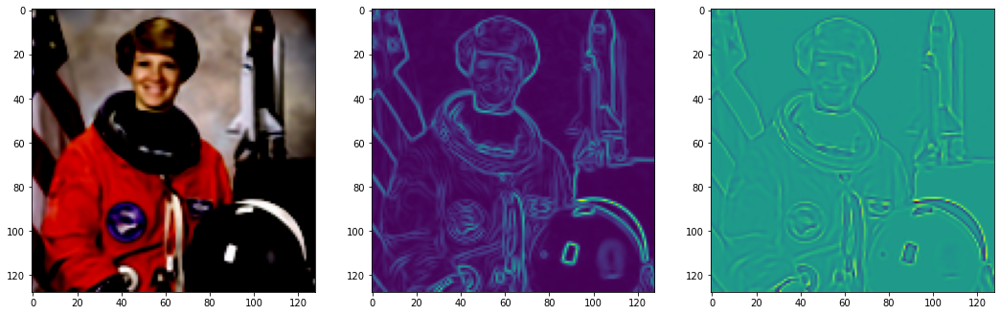

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 190, Total loss 0.001209
Size image:  torch.Size([1, 1, 16384, 3])


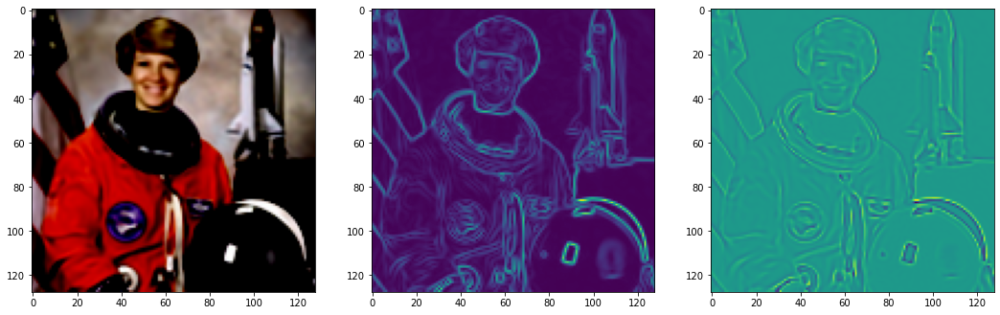

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 200, Total loss 0.001550
Size image:  torch.Size([1, 1, 16384, 3])


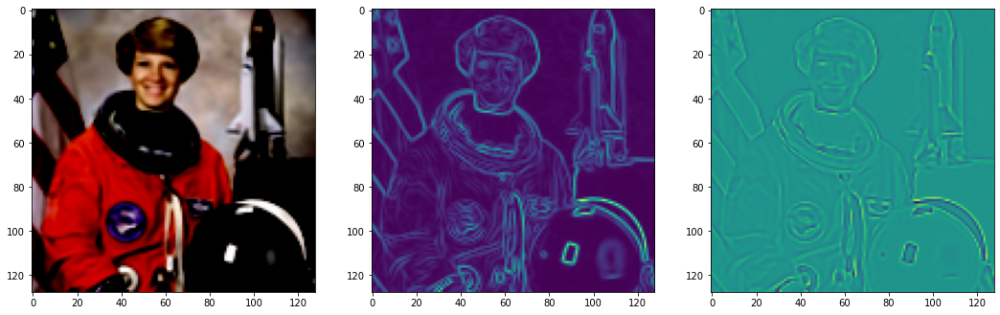

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 210, Total loss 0.001067
Size image:  torch.Size([1, 1, 16384, 3])


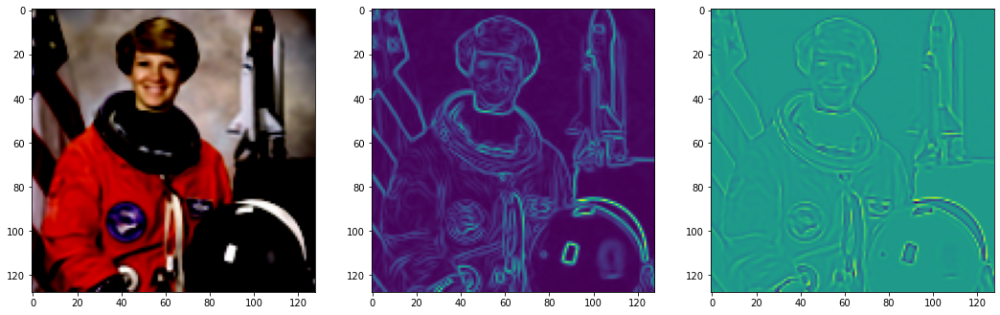

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 220, Total loss 0.000944
Size image:  torch.Size([1, 1, 16384, 3])


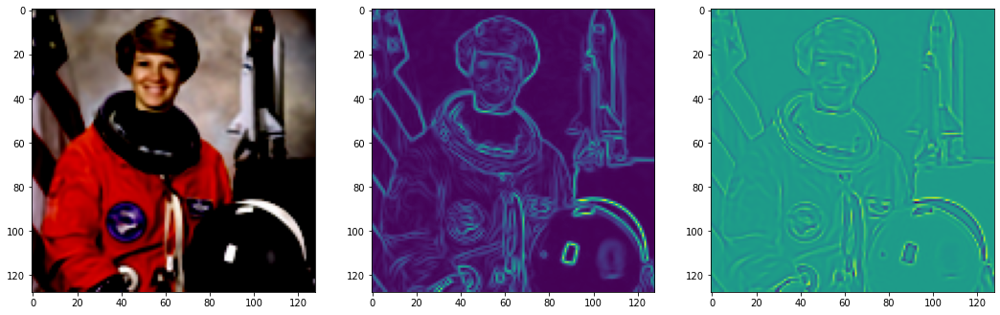

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 230, Total loss 0.000840
Size image:  torch.Size([1, 1, 16384, 3])


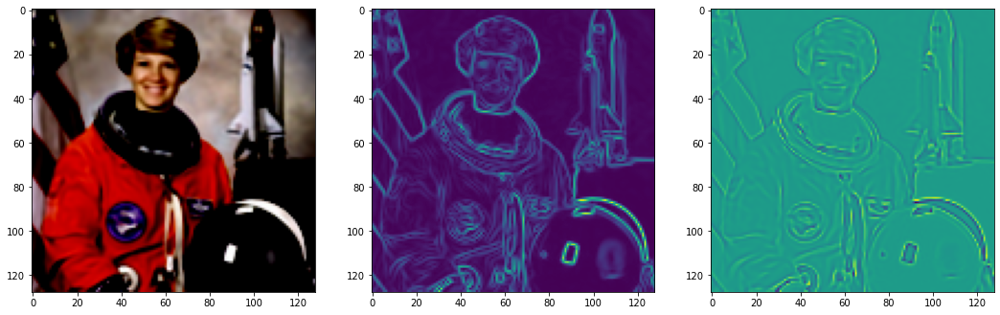

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 240, Total loss 0.000768
Size image:  torch.Size([1, 1, 16384, 3])


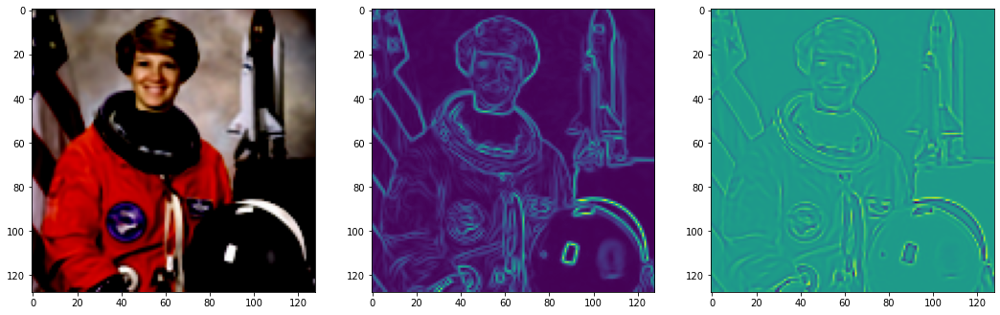

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 250, Total loss 0.000700
Size image:  torch.Size([1, 1, 16384, 3])


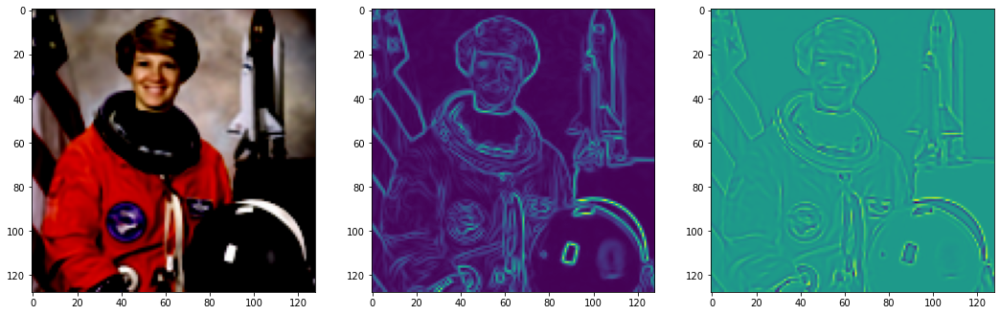

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 260, Total loss 0.000642
Size image:  torch.Size([1, 1, 16384, 3])


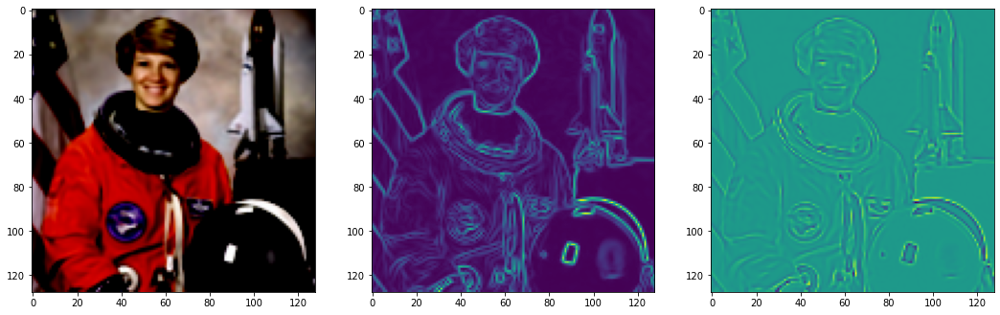

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 270, Total loss 0.000591
Size image:  torch.Size([1, 1, 16384, 3])


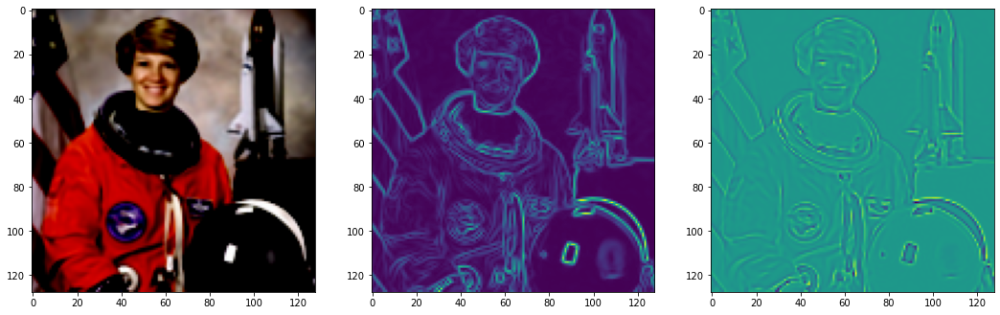

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 280, Total loss 0.000546
Size image:  torch.Size([1, 1, 16384, 3])


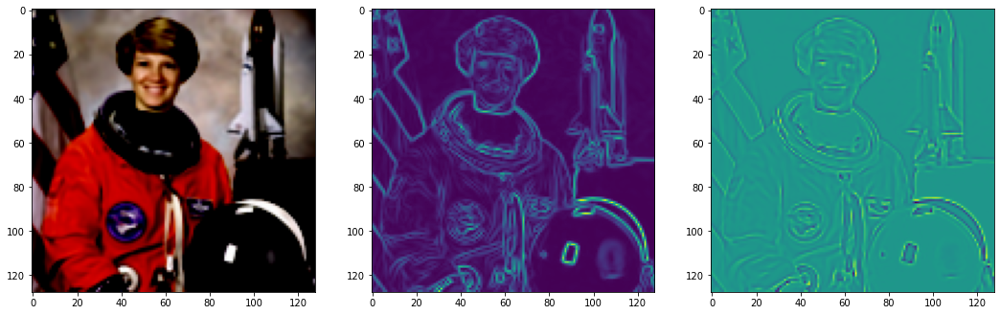

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 290, Total loss 0.000645
Size image:  torch.Size([1, 1, 16384, 3])


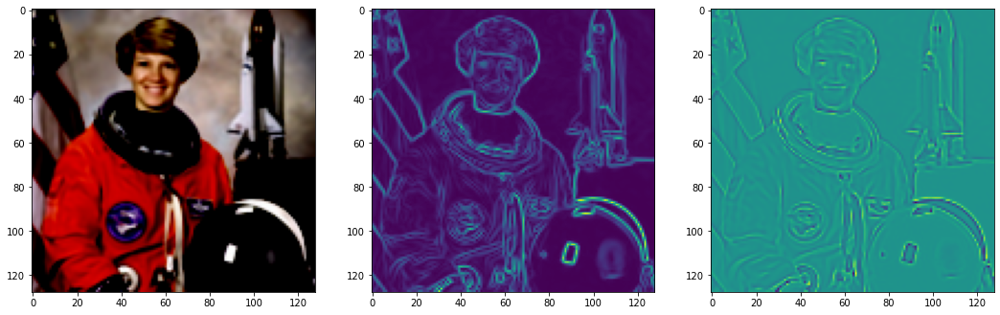

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 300, Total loss 0.000562
Size image:  torch.Size([1, 1, 16384, 3])


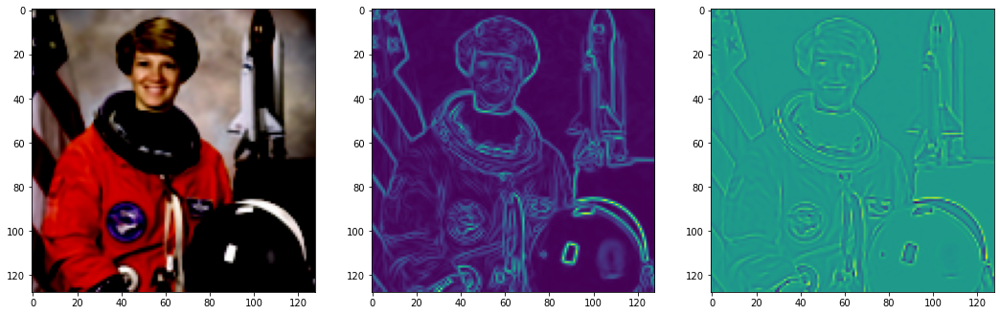

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 310, Total loss 0.000469
Size image:  torch.Size([1, 1, 16384, 3])


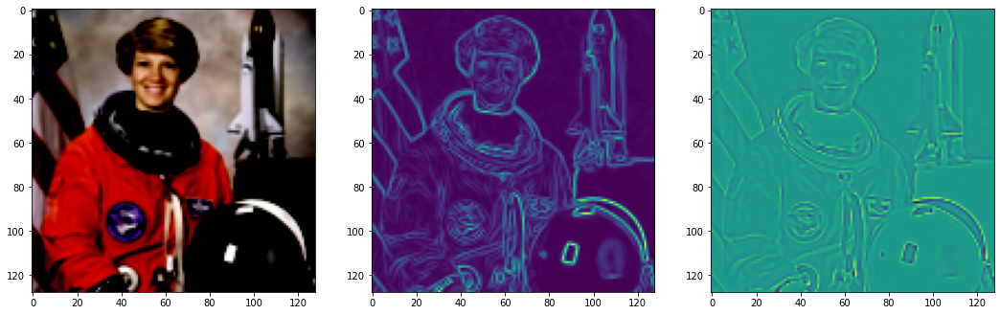

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 320, Total loss 0.000422
Size image:  torch.Size([1, 1, 16384, 3])


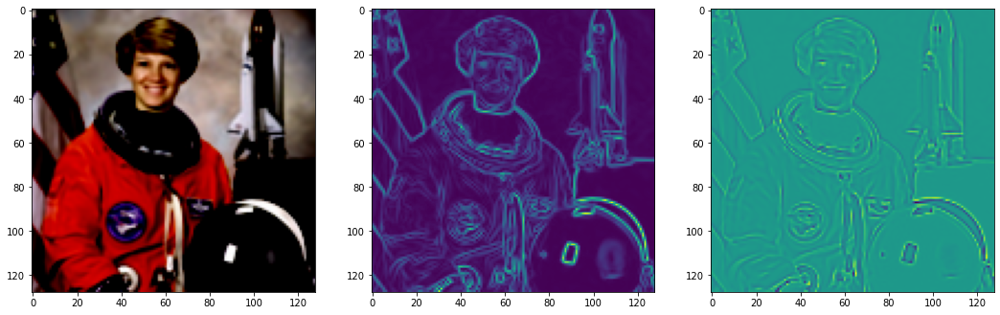

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 330, Total loss 0.000384
Size image:  torch.Size([1, 1, 16384, 3])


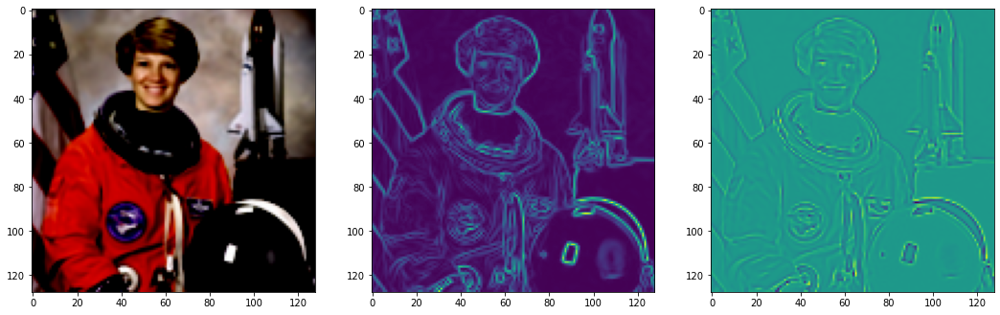

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 340, Total loss 0.000357
Size image:  torch.Size([1, 1, 16384, 3])


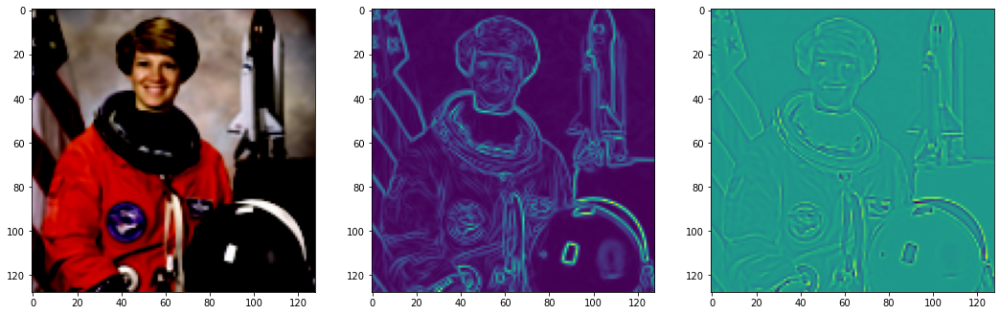

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 350, Total loss 0.000333
Size image:  torch.Size([1, 1, 16384, 3])


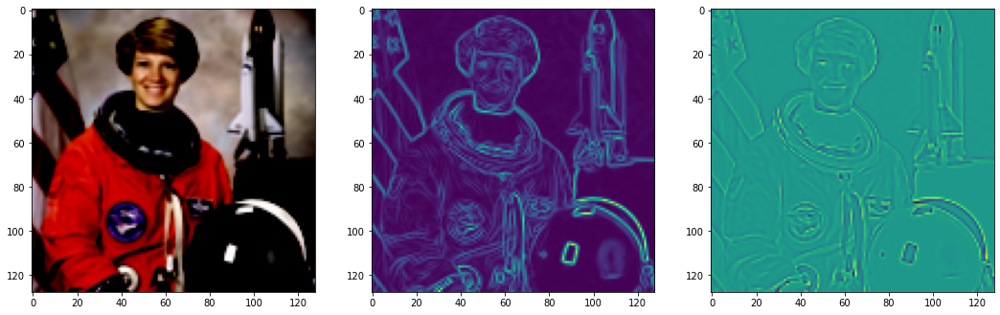

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 360, Total loss 0.000311
Size image:  torch.Size([1, 1, 16384, 3])


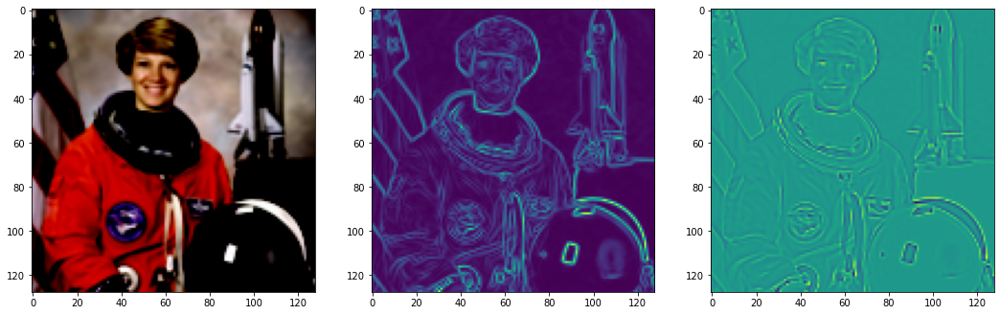

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 370, Total loss 0.000339
Size image:  torch.Size([1, 1, 16384, 3])


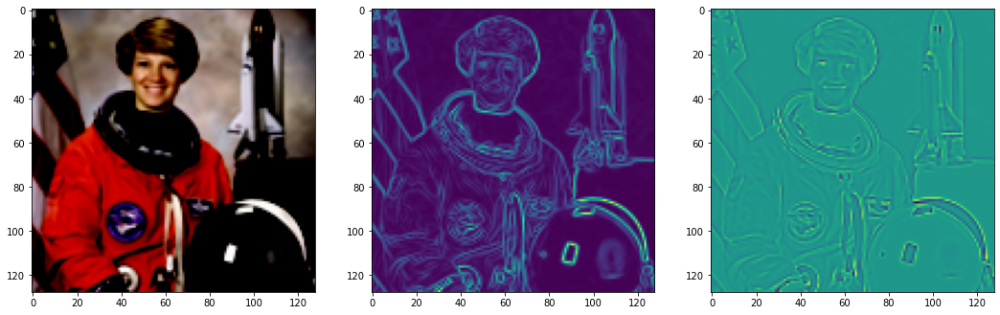

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 380, Total loss 0.000472
Size image:  torch.Size([1, 1, 16384, 3])


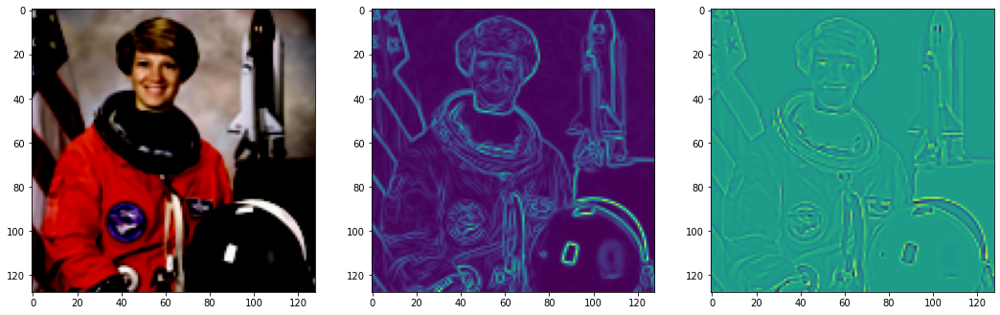

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 390, Total loss 0.000300
Size image:  torch.Size([1, 1, 16384, 3])


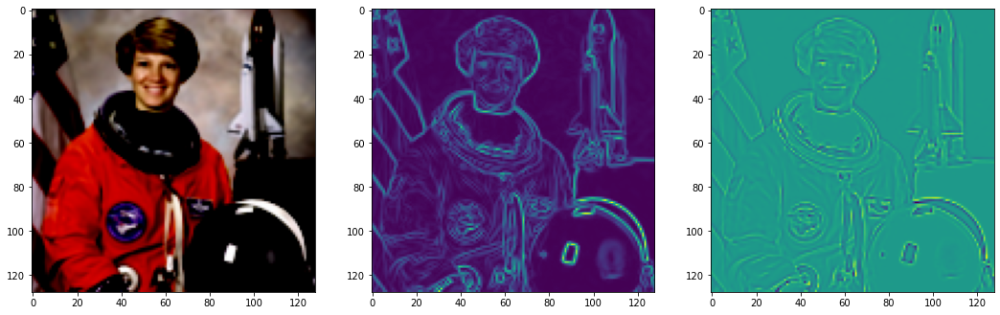

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 400, Total loss 0.000261
Size image:  torch.Size([1, 1, 16384, 3])


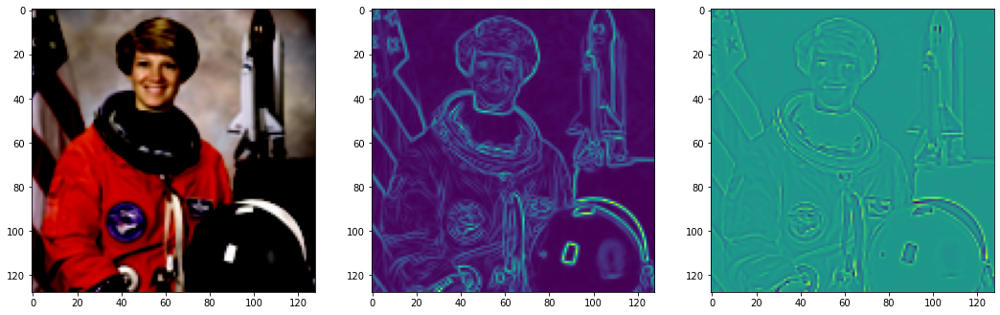

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 410, Total loss 0.000237
Size image:  torch.Size([1, 1, 16384, 3])


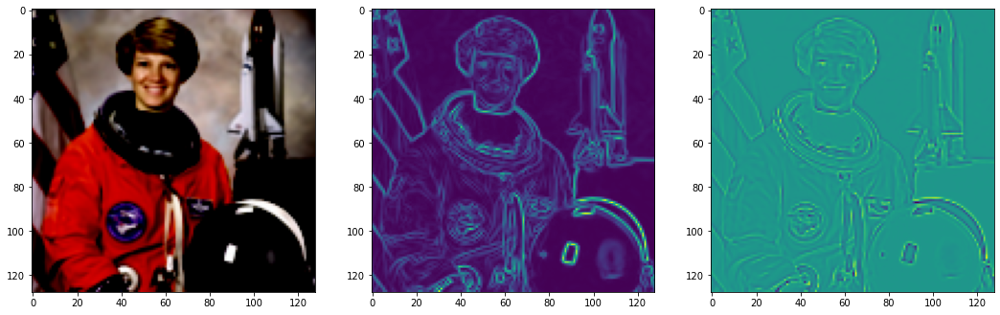

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 420, Total loss 0.000220
Size image:  torch.Size([1, 1, 16384, 3])


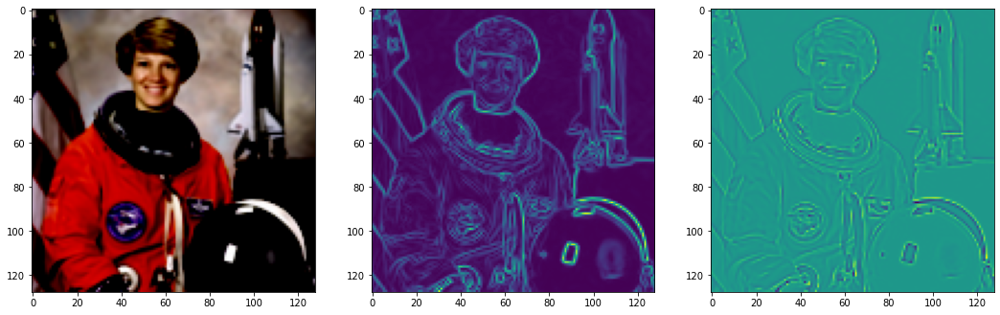

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 430, Total loss 0.000207
Size image:  torch.Size([1, 1, 16384, 3])


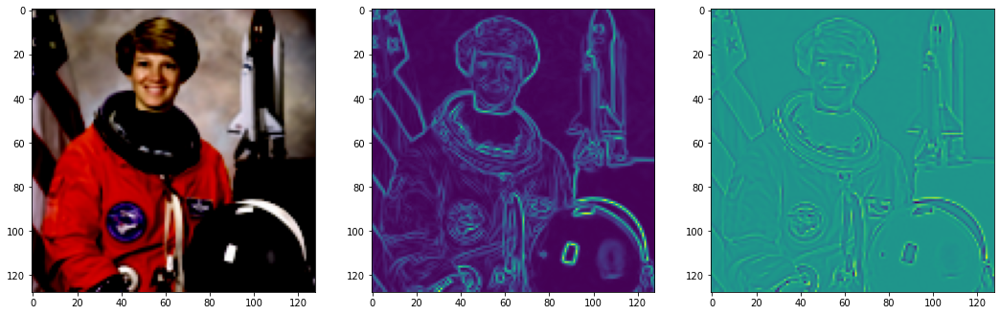

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 440, Total loss 0.000195
Size image:  torch.Size([1, 1, 16384, 3])


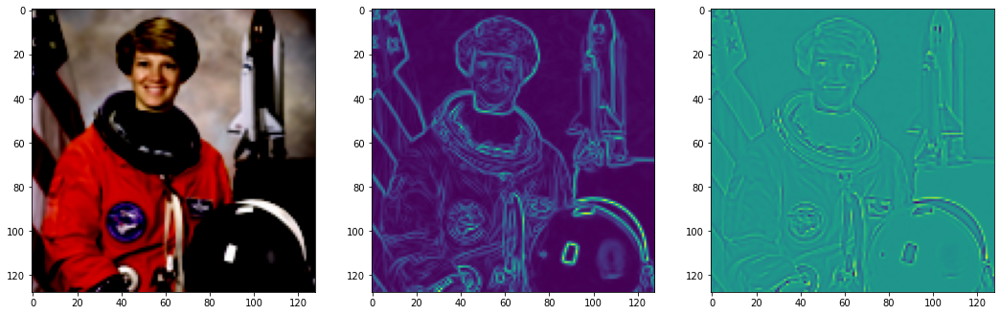

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 450, Total loss 0.000184
Size image:  torch.Size([1, 1, 16384, 3])


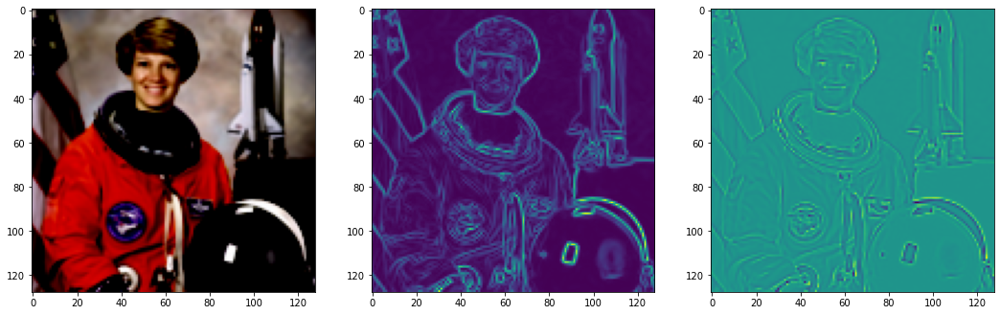

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 460, Total loss 0.000232
Size image:  torch.Size([1, 1, 16384, 3])


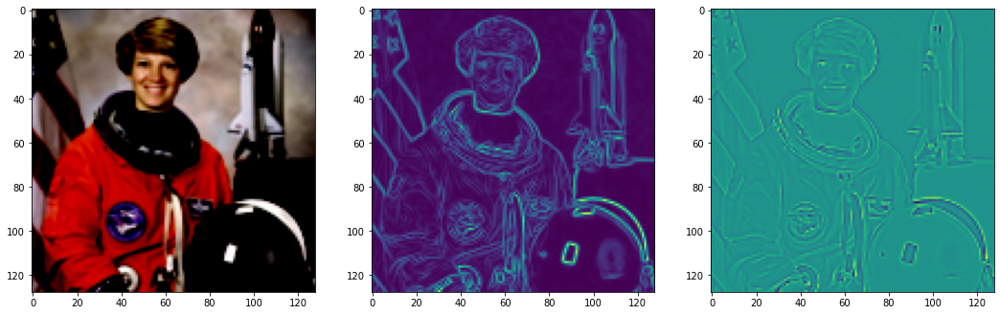

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 470, Total loss 0.000209
Size image:  torch.Size([1, 1, 16384, 3])


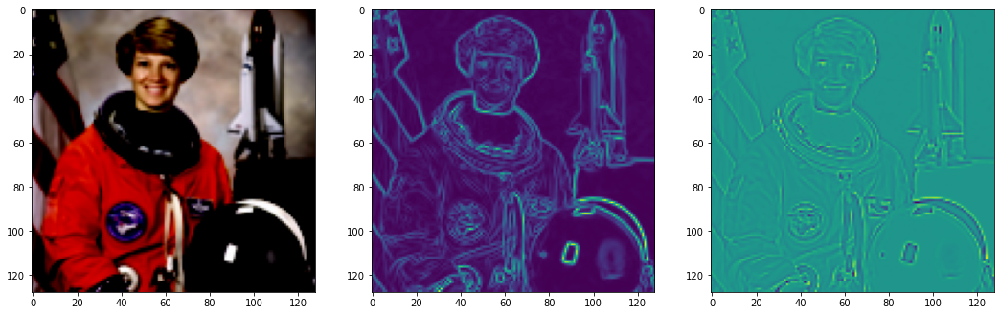

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 480, Total loss 0.000170
Size image:  torch.Size([1, 1, 16384, 3])


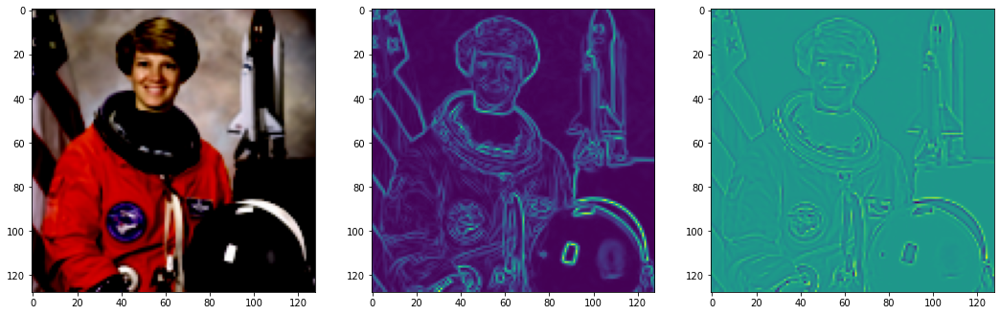

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 490, Total loss 0.000156
Size image:  torch.Size([1, 1, 16384, 3])


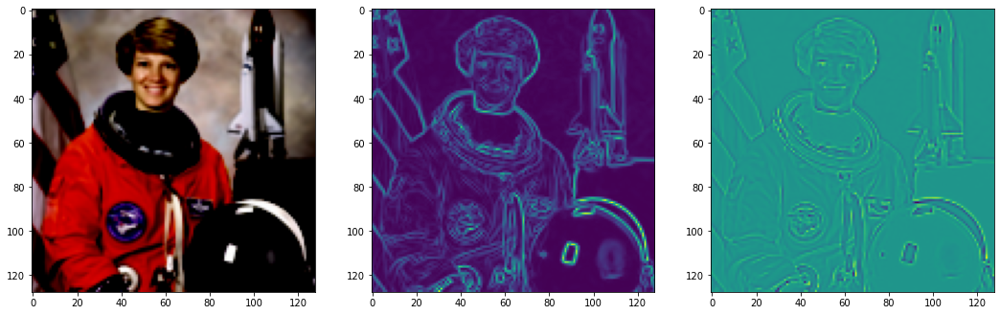

Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])
Output size:  torch.Size([1, 1, 16384, 3])
Groundtruth size:  torch.Size([1, 1, 16384, 3])


In [ ]:
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader1))
ground_truth=ground_truth.permute(0, 2, 3, 1).view(1, 1, size_img**2, 3)
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
print("Input, output sizes; ", model_input.size(), ground_truth.size())
print("Model_input: ", model_input[0, :3, :3])

for step in range(total_steps):
    
    model_output, coords = img_siren(model_input)
    print("Output size: ", model_output.size())
    print("Groundtruth size: ", ground_truth.size())
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        print("Size image: ", model_output.cpu().size())
        axes[0].imshow(model_output.cpu().view(size_img,size_img, 3).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu()[:, :1].view(size_img,size_img).detach().numpy())
        axes[2].imshow(img_laplacian.cpu()[:, :1].view(size_img,size_img).detach().numpy())

        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

And now we change the size of the image that we want: instead of asking for an image 128*128, we ask for something bigger. What is the result?

In [ ]:
size_img_2=512
model_input=get_mgrid(size_img_2, dim=2, depth=1)
(l1, l2, l3)=model_input.size()

In [ ]:
model_input=model_input.cuda()
model_output, coords = img_siren(model_input)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


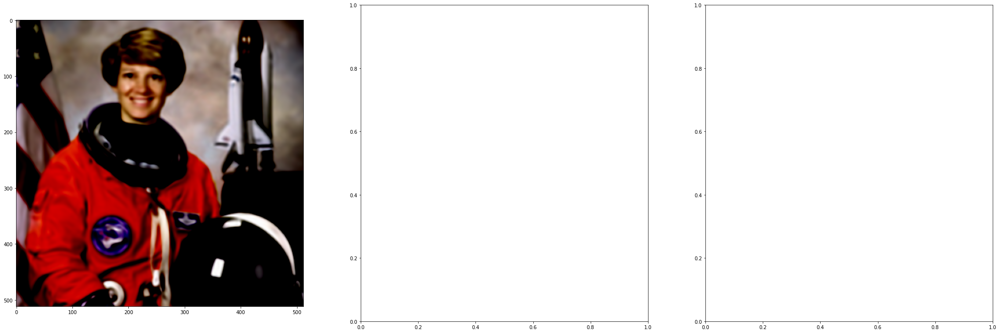

In [ ]:
#img_grad = gradient(model_output, coords)
#img_laplacian = laplace(model_output, coords)

fig, axes = plt.subplots(1,3, figsize=(36,12))
axes[0].imshow(model_output.cpu().view(size_img_2,size_img_2, 3).detach().numpy())
#axes[1].imshow(img_grad.norm(dim=-1).cpu().view(size_img_2,size_img_2, 3).detach().numpy())
#axes[2].imshow(img_laplacian.cpu().view(size_img,size_img, 3).detach().numpy())